In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn import preprocessing, svm
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from mlxtend.feature_selection import SequentialFeatureSelector
import warnings  
warnings.filterwarnings('ignore') 

In [2]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F2003977%2F4465d9311ccae2f9ccb057fc7e14f26f%2FScreenshot%20from%202023-10-18%2009-42-52.png?generation=1697586187040332&alt=media")

In [3]:
data = pd.read_csv('cirrhosis.csv')
data.head()

,ID,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,1,400,D,D-penicillamine,21464,F,Y,Y,Y,Y,14.5,261.0,2.60,156.0,1718.0,137.95,172.0,190.0,12.2,4.0
1,2,4500,C,D-penicillamine,20617,F,N,Y,Y,N,1.1,302.0,4.14,54.0,7394.8,113.52,88.0,221.0,10.6,3.0
2,3,1012,D,D-penicillamine,25594,M,N,N,N,S,1.4,176.0,3.48,210.0,516.0,96.10,55.0,151.0,12.0,4.0
3,4,1925,D,D-penicillamine,19994,F,N,Y,Y,S,1.8,244.0,2.54,64.0,6121.8,60.63,92.0,183.0,10.3,4.0
4,5,1504,CL,Placebo,13918,F,N,Y,Y,N,3.4,279.0,3.53,143.0,671.0,113.15,72.0,136.0,10.9,3.0


In [4]:
data.shape

(418, 20)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             418 non-null    int64  
 1   N_Days         418 non-null    int64  
 2   Status         418 non-null    object 
 3   Drug           312 non-null    object 
 4   Age            418 non-null    int64  
 5   Sex            418 non-null    object 
 6   Ascites        312 non-null    object 
 7   Hepatomegaly   312 non-null    object 
 8   Spiders        312 non-null    object 
 9   Edema          418 non-null    object 
 10  Bilirubin      418 non-null    float64
 11  Cholesterol    284 non-null    float64
 12  Albumin        418 non-null    float64
 13  Copper         310 non-null    float64
 14  Alk_Phos       312 non-null    float64
 15  SGOT           312 non-null    float64
 16  Tryglicerides  282 non-null    float64
 17  Platelets      407 non-null    float64
 18  Prothrombi

### Splitting into training and testing datasets.

In [6]:
X = data.drop('Status', axis = 1)
y = data['Status']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20)

In [7]:
(X_train.isnull().sum()/ len(X_train))*100

ID                0.000000
N_Days            0.000000
Drug             23.652695
Age               0.000000
Sex               0.000000
Ascites          23.652695
Hepatomegaly     23.652695
Spiders          23.652695
Edema             0.000000
Bilirubin         0.000000
Cholesterol      31.437126
Albumin           0.000000
Copper           23.952096
Alk_Phos         23.652695
SGOT             23.652695
Tryglicerides    32.035928
Platelets         2.095808
Prothrombin       0.299401
Stage             1.497006
dtype: float64

In [8]:
(y_train.isnull().sum()/ len(y_train))*100

0.0

### Outlier Detection using Interquartile Range

In [9]:
for i in X_train.select_dtypes(include = ['int64', 'float64']):
    Q1 = X_train[i].quantile(0.25)
    Q3 = X_train[i].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    print(i, "----->", len(np.where(X_train[i] > upper_bound)[0])+len(np.where(X_train[i] < lower_bound)[0]))

ID -----> 0
N_Days -----> 0
Age -----> 0
Bilirubin -----> 35
Cholesterol -----> 16
Albumin -----> 8
Copper -----> 14
Alk_Phos -----> 28
SGOT -----> 6
Tryglicerides -----> 7
Platelets -----> 3
Prothrombin -----> 16
Stage -----> 0


### Handling missing values in categorical variables by imputation using mode and numerical variables by imputation using median as many outliers are present.

In [10]:
for i in X_train.columns.drop(['Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema', 'Stage']):
    X_train[i] = X_train[i].fillna(X_train[i].median()) 

In [11]:
cols = ['Drug', 'Ascites', 'Hepatomegaly', 'Spiders', 'Stage']
for i in cols:
    X_train[i] = X_train[i].fillna(X_train[i].mode()[0]) 

### Boxplot

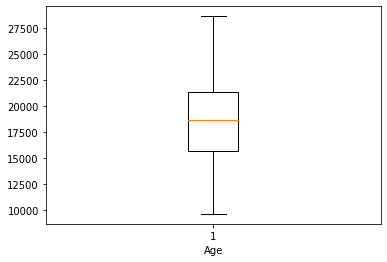

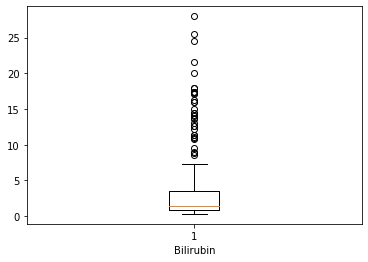

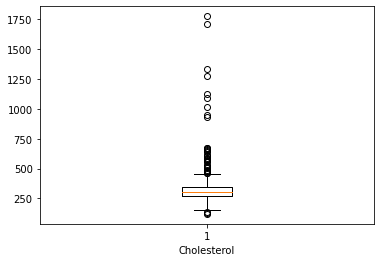

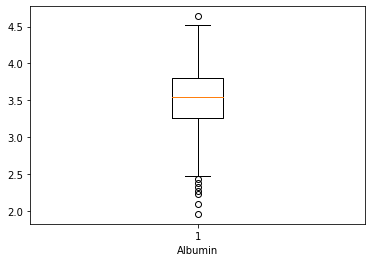

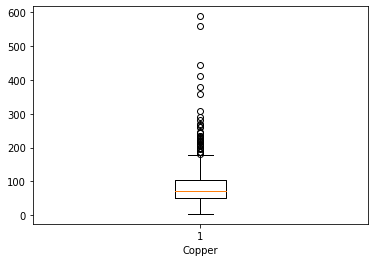

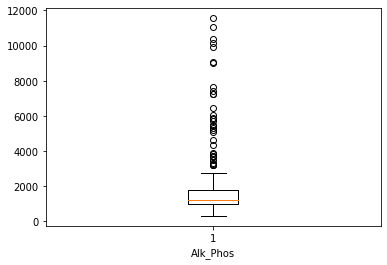

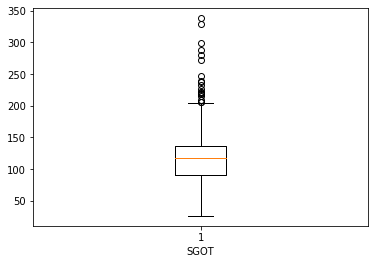

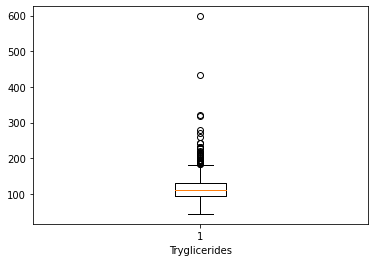

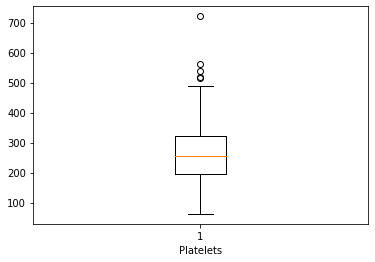

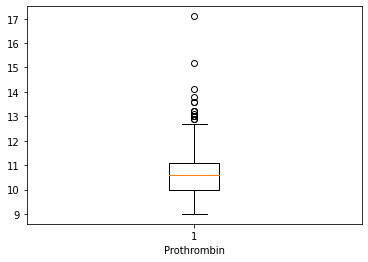

In [12]:
for i in X_train.select_dtypes(['int64', 'float64']).drop(['Stage', 'ID', 'N_Days'], axis = 1):
    plt.boxplot(X_train[i])
    plt.xlabel(i)
    plt.show()

### Checking skewness due to outliers.

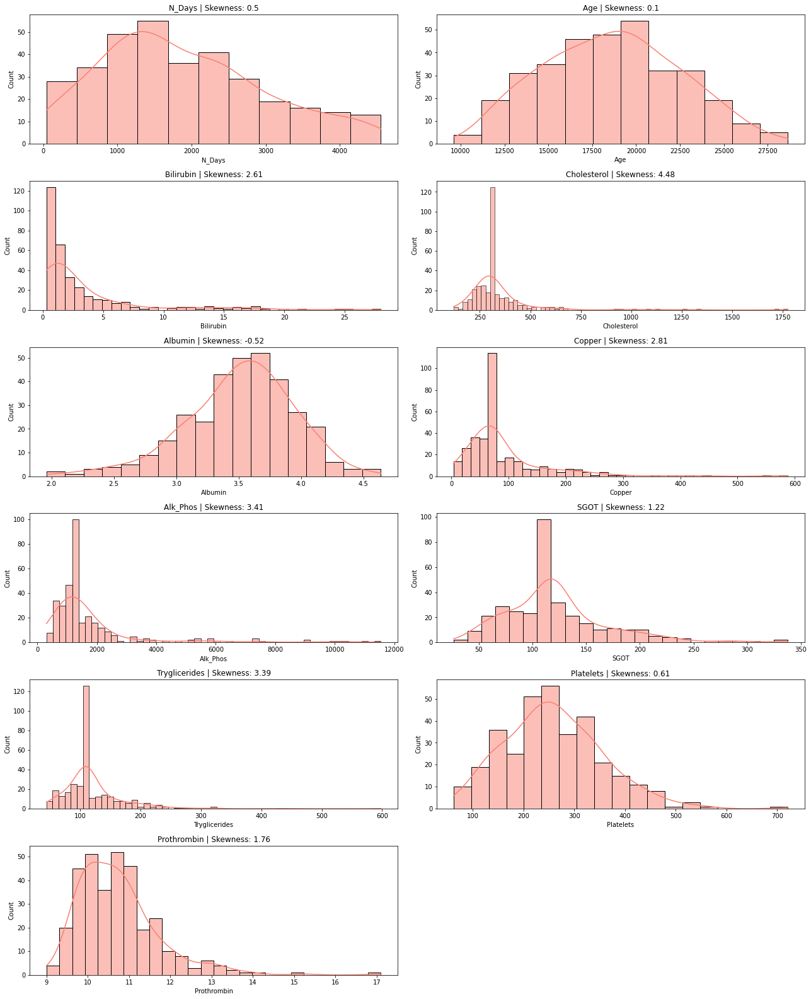

In [13]:
numerical_columns = X_train.select_dtypes(include = ['int64', 'float64']).columns.drop(['ID', 'Stage'])

plt.figure(figsize = (18, 40))
for idx, feature in enumerate(numerical_columns, 1):
    plt.subplot(len(numerical_columns), 2, idx)
    sns.histplot(X_train[feature], kde = True, color = "salmon")
    plt.title(f"{feature} | Skewness: {round(X_train[feature].skew(), 2)}")
plt.tight_layout()
plt.show()

### Outlier Detection using K-means Clustering

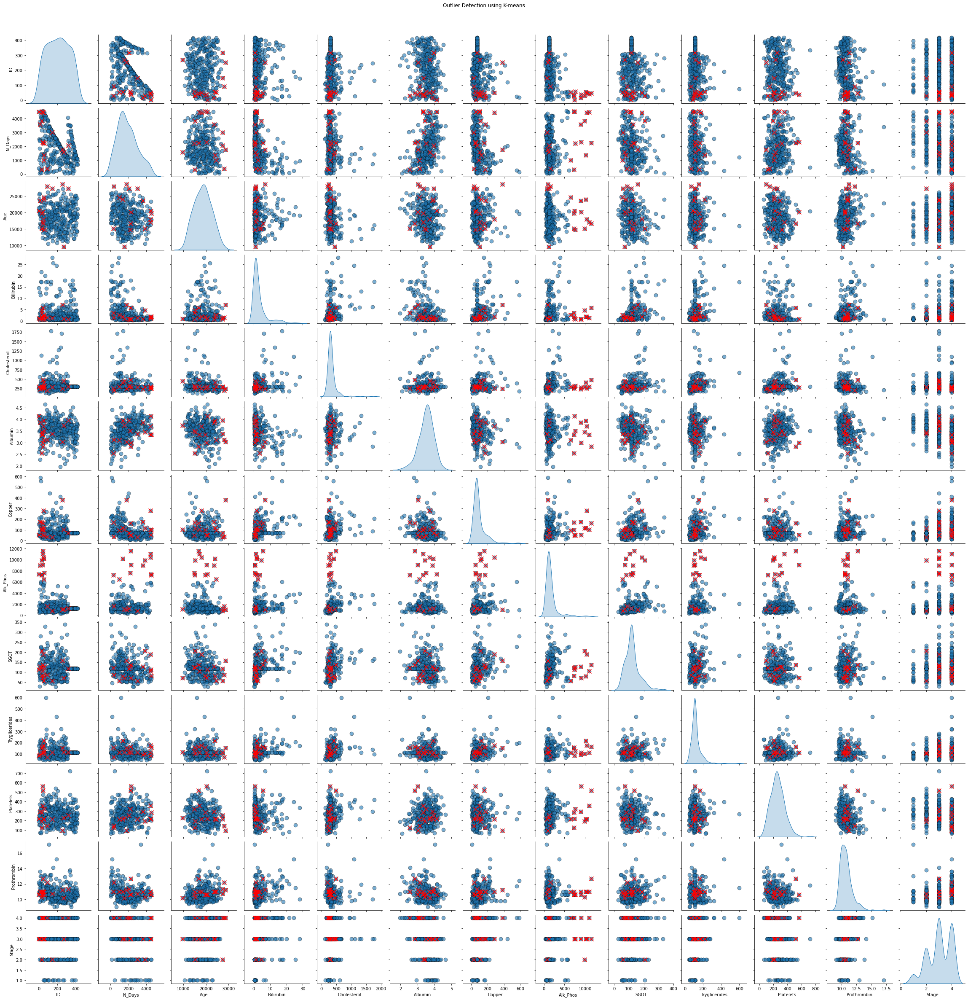

In [14]:
kmeans = KMeans(n_clusters=2)                                    
numerical_columns = X_train.select_dtypes(include=['int64', 'float64']).columns
kmeans.fit(X_train[numerical_columns])                           

distances = kmeans.transform(X_train[numerical_columns])
closest_cluster_distances = np.min(distances, axis=1)
threshold = np.percentile(closest_cluster_distances, 95)  
outliers = X_train[closest_cluster_distances > threshold]

sns.pairplot(data=X_train[numerical_columns], diag_kind='kde', plot_kws={'alpha': 0.6, 's': 80, 'edgecolor': 'k'})
for ax in plt.gcf().axes:
    x_col = ax.get_xlabel()
    y_col = ax.get_ylabel()
    if x_col in numerical_columns and y_col in numerical_columns:
        if x_col in outliers.columns and y_col in outliers.columns:  
            ax.scatter(outliers[x_col], outliers[y_col], color='red', marker='x', s=100)
plt.suptitle('Outlier Detection using K-means', y=1.02)
plt.show()

### Skewness Report

In [15]:
numerical_cols = X_train.select_dtypes(include=['int64', 'float64']).columns.drop(['ID', 'Stage', 'Age'])
skewness = X_train[numerical_cols].skew()
skewness

N_Days           0.495249
Bilirubin        2.607346
Cholesterol      4.481682
Albumin         -0.518790
Copper           2.810164
Alk_Phos         3.413794
SGOT             1.224225
Tryglicerides    3.392182
Platelets        0.612853
Prothrombin      1.762323
dtype: float64

### Applying Log transformation to positively skewed data.

In [16]:
pos_skewed_cols = ['Bilirubin', 'Cholesterol', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin']
X_train[pos_skewed_cols] = X_train[pos_skewed_cols].apply(lambda x: np.log(x + 1) if (x > 0).all() else x)

### Applying square root transformation to negatively skewed data.

In [17]:
neg_skewed_cols = ['Albumin']
for col in neg_skewed_cols:
    X_train[col] = np.sqrt(np.maximum(X_train[col] + 1, 0))

In [18]:
X_train

,ID,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
93,94,750,D-penicillamine,19693,F,N,Y,Y,N,1.435085,5.308268,2.027313,5.187386,7.100852,5.079228,4.248495,5.241747,2.549445,4.0
251,252,1770,D-penicillamine,25006,F,N,Y,Y,N,0.741937,5.509388,2.085665,4.762174,6.829794,4.737513,4.510860,5.762051,2.397895,4.0
111,112,3445,Placebo,20256,F,N,Y,Y,N,1.098612,5.590987,2.161018,4.499810,6.626718,5.287509,4.510860,4.919981,2.549445,4.0
258,259,1615,Placebo,21904,F,N,Y,N,N,1.410987,5.627621,1.992486,3.761200,7.013016,4.836282,4.844187,5.402677,2.379546,3.0
63,64,1487,Placebo,22977,F,N,Y,N,N,1.131402,5.924256,2.121320,3.970292,6.917706,5.019595,5.241747,5.187386,2.484907,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,140,3059,D-penicillamine,19751,F,N,Y,N,N,0.741937,5.673323,2.256103,3.663562,7.659643,5.231109,4.990433,5.765191,2.397895,3.0
129,130,1413,Placebo,16154,F,N,Y,Y,N,2.912351,7.482119,2.104757,5.327876,7.633370,5.117095,4.584967,6.037871,2.525729,3.0
96,97,611,Placebo,26259,M,N,Y,N,S,1.098612,6.042633,2.063977,4.143135,8.069968,4.363099,4.521789,5.843544,2.517696,3.0
346,347,2812,D-penicillamine,18628,F,N,N,N,N,1.481605,5.717028,2.218107,4.297285,7.121252,4.770685,4.718499,5.545177,2.332144,2.0


### Checking skewness after applying transformations.

In [19]:
numerical_cols = X_train.select_dtypes(include=['int64', 'float64']).columns.drop(['ID', 'Stage'])
skewness = X_train[numerical_cols].skew()
skewness

N_Days           0.495249
Age              0.096908
Bilirubin        1.116812
Cholesterol      1.584739
Albumin         -0.703123
Copper          -0.194834
Alk_Phos         1.132312
SGOT            -0.292232
Tryglicerides    0.447222
Platelets       -0.626845
Prothrombin      1.284519
dtype: float64

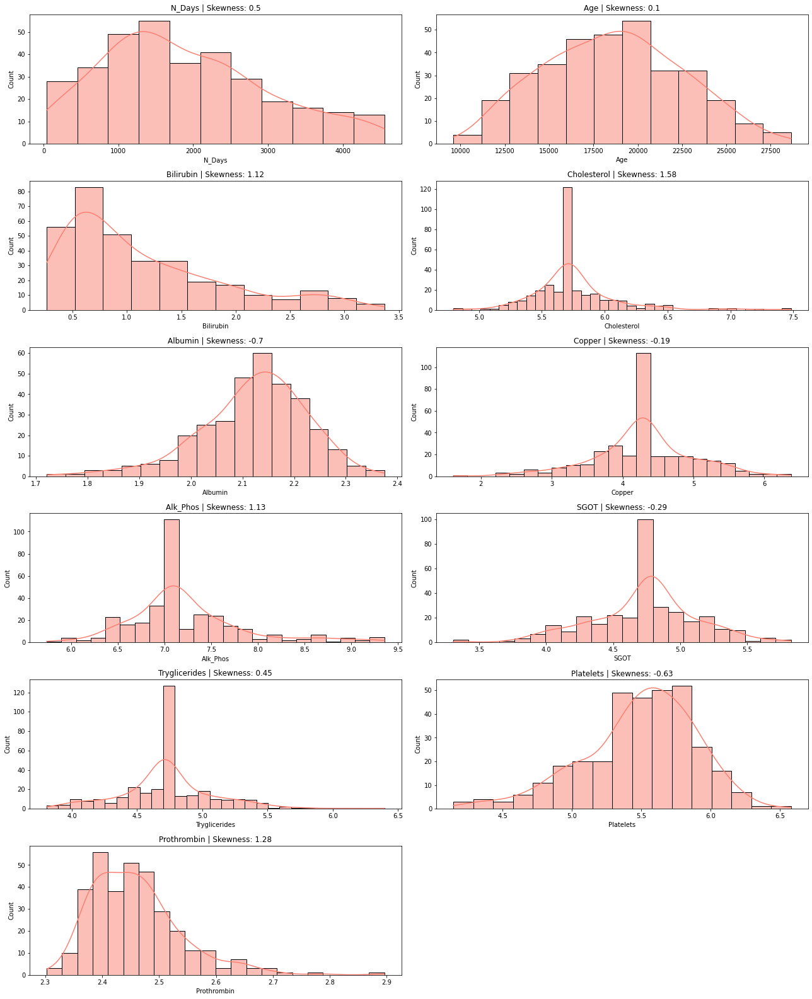

In [20]:
numerical_columns = X_train.select_dtypes(include = ['int64', 'float64']).columns.drop(['ID', 'Stage'])

plt.figure(figsize = (18, 40))
for idx, feature in enumerate(numerical_columns, 1):
    plt.subplot(len(numerical_columns), 2, idx)
    sns.histplot(X_train[feature], kde = True, color = "salmon")
    plt.title(f"{feature} | Skewness: {round(X_train[feature].skew(), 2)}")
plt.tight_layout()
plt.show()

### Exploratory Data Analysis

In [21]:
train_data = pd.concat([X_train, y_train], axis=1)

##### "censored" refers to individuals who have not experienced the event of interest by the end of the study, "censored due to liver" specifically refers to individuals whose follow-up ends due to liver transplantation, and "death in cirrhosis" refers to individuals who have died due to liver cirrhosis and are not censored in the analysis.

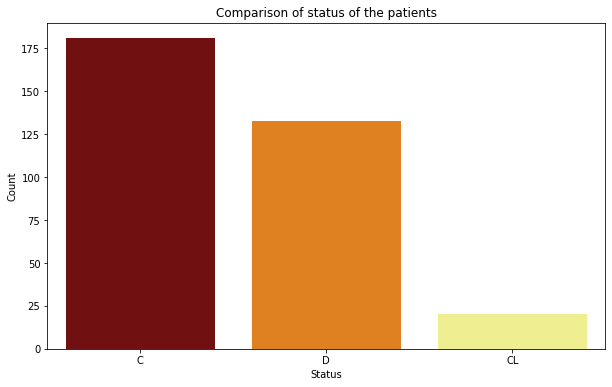

Conclusion: In the survival analysis, most patients were categorized as not experiencing death, representing the majority. Following this group were those who encountered death, and a small fraction underwent liver transplant.


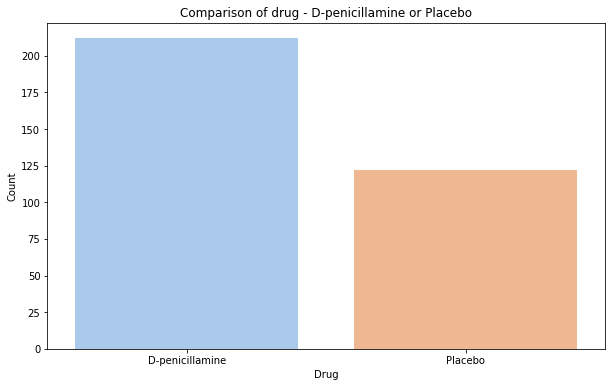

Conclusion: The number of patients taking D-penicillamine is greater than Placebo.


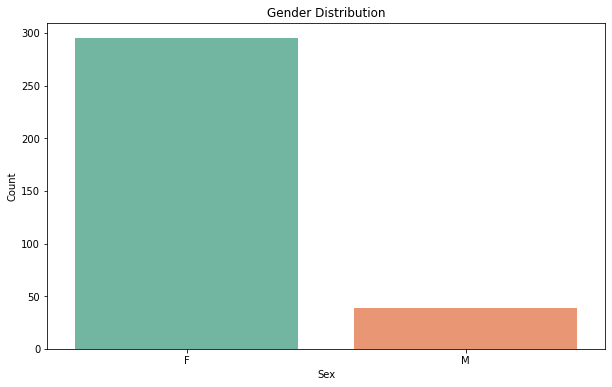

Conclusion: There is a higher percentage of female patients compared to male patients.


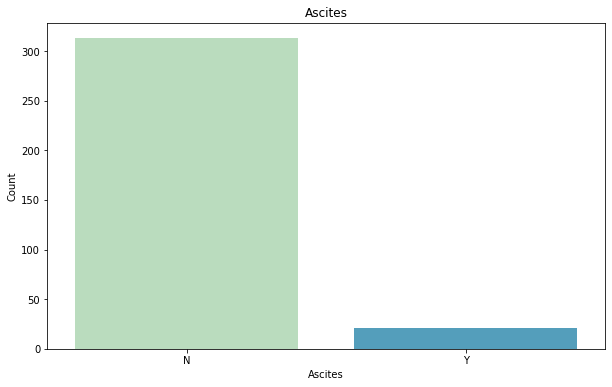

Conclusion: The majority of patients did not exhibit abdominal fluid buildup.


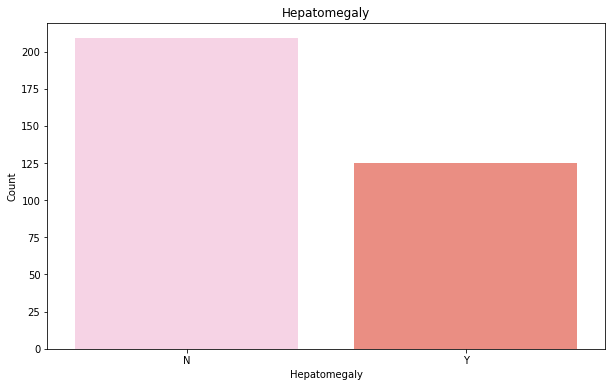

Conclusion: The percentage of individuals with an enlarged liver is greater than those without this condition.


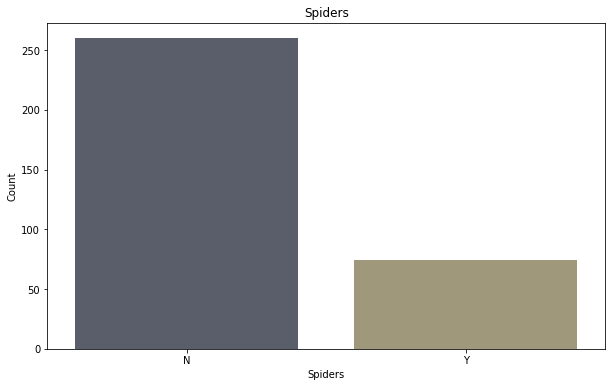

Conclusion: The majority of individuals in the dataset did not exhibit observable blood vessels on their skin.


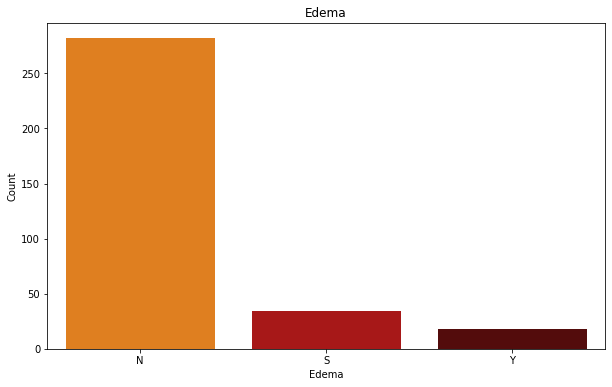

Conclusion: Most patients don't experience swelling and didn't require diuretic treatment for it, compared to those who have swelling but haven't used diuretics or have resolved their swelling with diuretics. The fewest patients are those who still have swelling despite using diuretics.


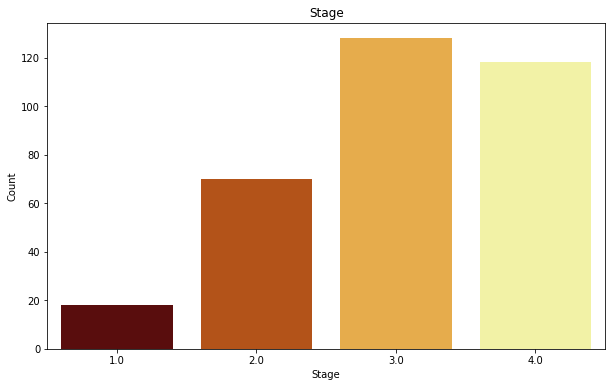

Conclusion: Stage 3 histopathological cirrhosis is the predominant stage, with stages 4, 2, and 1 following in decreasing frequency.


In [22]:
def plot_and_conclude(column_name, xlabel, title, conclusion, palette):
    counts = train_data[column_name].value_counts()
    plt.figure(figsize=(10, 6))
    sns.barplot(x=counts.index, y=counts, palette=palette)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Count')
    plt.show()
    print("Conclusion:", conclusion)

plot_and_conclude('Status', 'Status', 'Comparison of status of the patients', 
                  "In the survival analysis, most patients were categorized as not experiencing death, representing the majority. Following this group were those who encountered death, and a small fraction underwent liver transplant.", "afmhot")

plot_and_conclude('Drug', 'Drug', 'Comparison of drug - D-penicillamine or Placebo', 
                  "The number of patients taking D-penicillamine is greater than Placebo.", "pastel")

plot_and_conclude('Sex', 'Sex', 'Gender Distribution', 
                  "There is a higher percentage of female patients compared to male patients.", "Set2")

plot_and_conclude('Ascites', 'Ascites', 'Ascites', 
                  "The majority of patients did not exhibit abdominal fluid buildup.", "GnBu")

plot_and_conclude('Hepatomegaly', 'Hepatomegaly', 'Hepatomegaly', 
                  "The percentage of individuals with an enlarged liver is greater than those without this condition.", "Set3_r")

plot_and_conclude('Spiders', 'Spiders', 'Spiders', 
                  "The majority of individuals in the dataset did not exhibit observable blood vessels on their skin.", "cividis")

plot_and_conclude('Edema', 'Edema', 'Edema', 
                  "Most patients don't experience swelling and didn't require diuretic treatment for it, compared to those who have swelling but haven't used diuretics or have resolved their swelling with diuretics. The fewest patients are those who still have swelling despite using diuretics.", "gist_heat_r")

plot_and_conclude('Stage', 'Stage', 'Stage', 
                  "Stage 3 histopathological cirrhosis is the predominant stage, with stages 4, 2, and 1 following in decreasing frequency.", "afmhot")

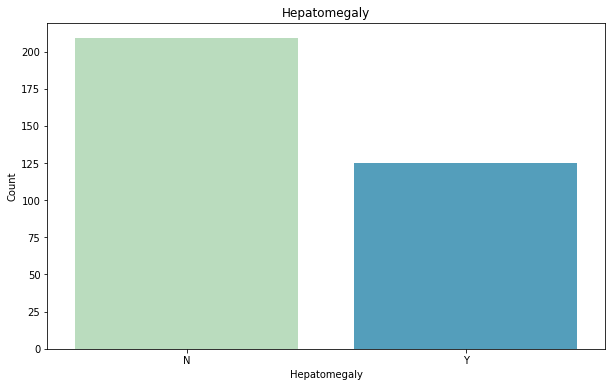

In [23]:
hepatomegaly_counts = train_data['Hepatomegaly'].value_counts()
plt.figure(figsize = (10, 6))
sns.barplot(x = hepatomegaly_counts.index, y = hepatomegaly_counts, palette='GnBu')
plt.title('Hepatomegaly')
plt.xlabel('Hepatomegaly')
plt.ylabel('Count')
plt.show()

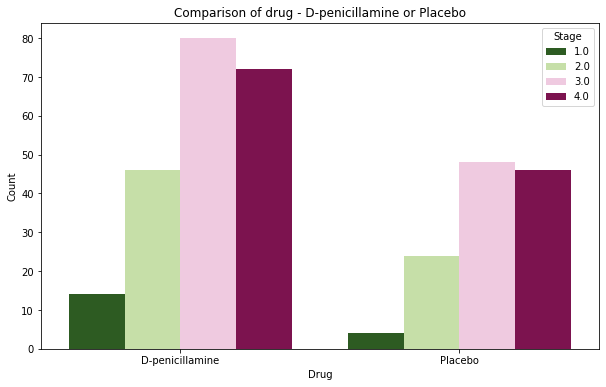

Conclusion: A greater number of individuals diagnosed with stage 1 cirrhosis opted for D-penicillamine over a placebo. Likewise, a significant portion of stage 2, 3 and 4 patients made the same choice.


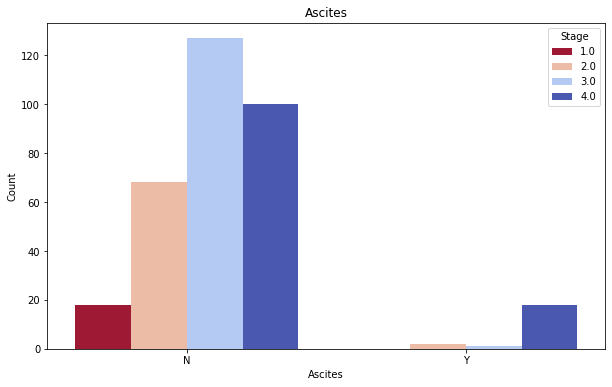

Conclusion: There were significantly fewer patients experiencing abdominal fluid buildup overall, with around 20 patients in stage 4 showing this condition compared to stages 2 and 3, where the occurrence was notably lower.


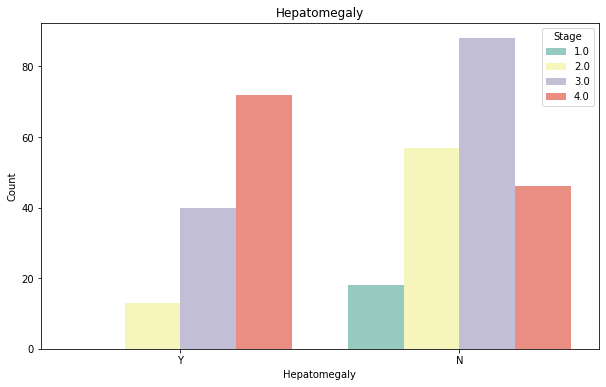

Conclusion: Patients in Stage 1 did not exhibit an enlarged liver. In Stage 2, the proportion of patients with both the conditions was equal. The majority of Stage 3 and 4 patients had an enlarged liver.


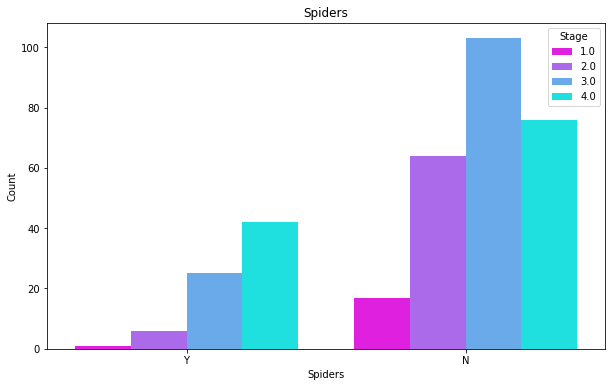

Conclusion: A greater proportion of individuals diagnosed with stage 1 cirrhosis exhibited no discernible blood vessels on their skin. This trend was also observed among stage 2 and 3 patients. For stage 4 patients, slightly more patients had no blood vessels visible on their skin.


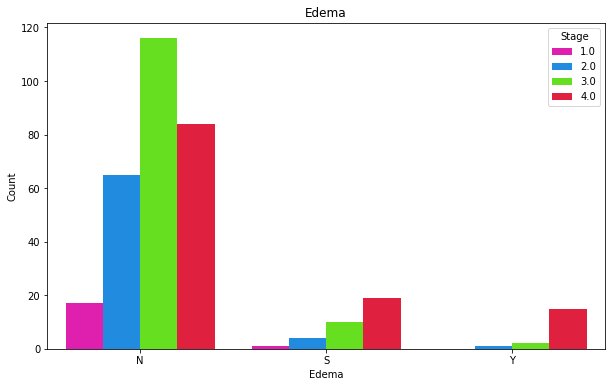

Conclusion: A greater percentage of individuals in stage 1 exhibited edema but did not receive treatment with diuretics or had their edema resolved by diuretic therapy. This trend was also observed among patients in stages 2, 3, and 4. In general, there were few patients across all stages who did not have edema and were not undergoing diuretic therapy for edema.


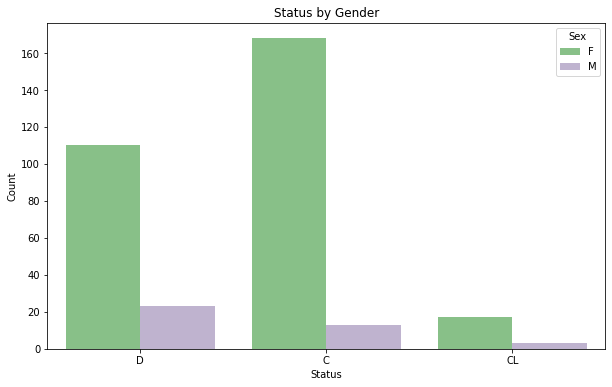

Conclusion: Among females, the predominant status was categorized as censored, indicating they had cirrhosis but did not experience death or undergo liver transplant. This implies that females with censored status outnumbered those who died, with very few undergoing liver transplants. In male patients, the highest count was of those who died, followed by individuals with censored status, while the occurrence of liver transplants was minimal.


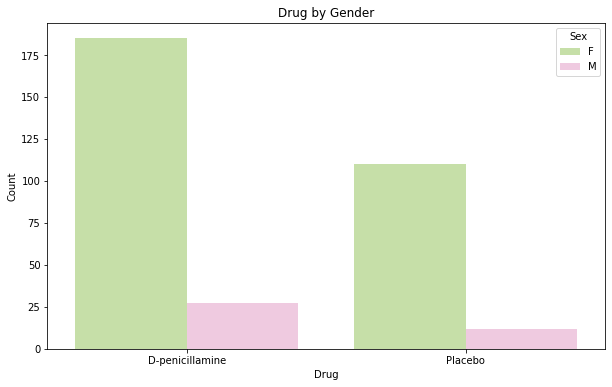

Conclusion: A greater proportion of female patients were given D-penicillamine in comparison to the placebo, whereas a slightly higher number of male patients received D-penicillamine.


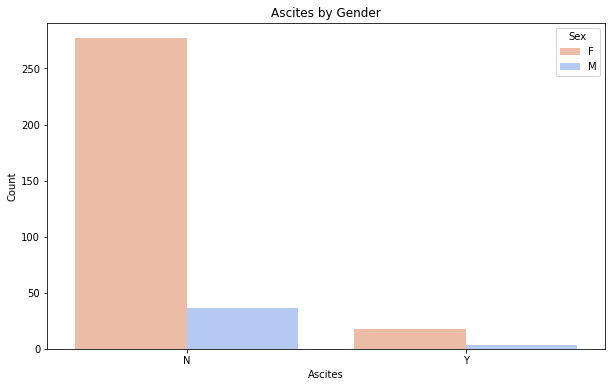

Conclusion: Ascites was not a common occurrence among both women and men. While only a few women encountered ascites, it was exceedingly rare among men.


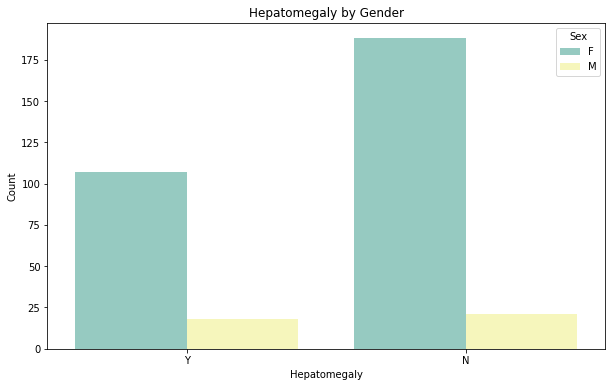

Conclusion: Most of the female patients displayed liver enlargement, whereas males had a slightly higher occurrence of enlarged livers compared to non-enlarged ones.


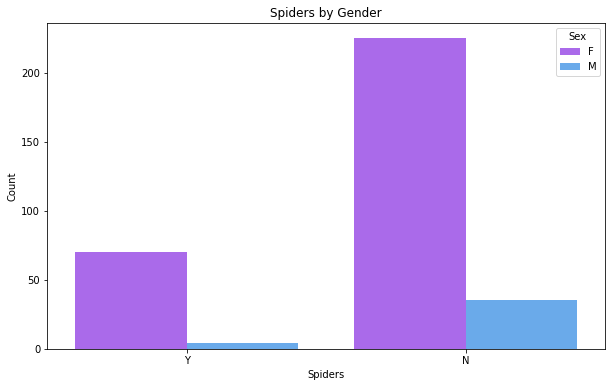

Conclusion: Most women didn't exhibit spider veins (visible blood vessels on the skin), and this was similarly uncommon among men, with only a few having them when observed.


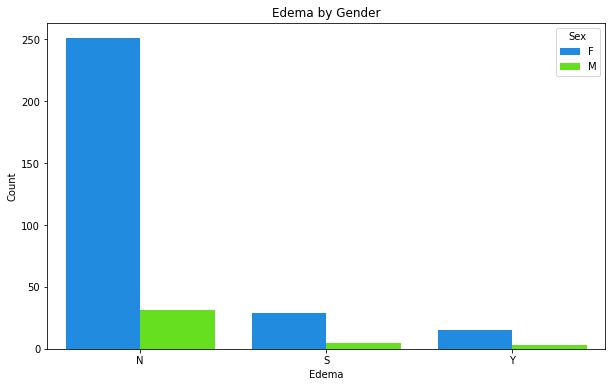

Conclusion: Most women did not exhibit edema and did not undergo diuretic treatment, followed by those who had edema but didn't receive diuretics, or those whose edema resolved with diuretic therapy, and finally those who still had edema despite diuretic treatment. Similarly, for men, the majority showed no edema and didn't undergo diuretic therapy, with only a small number falling into the other two categories.


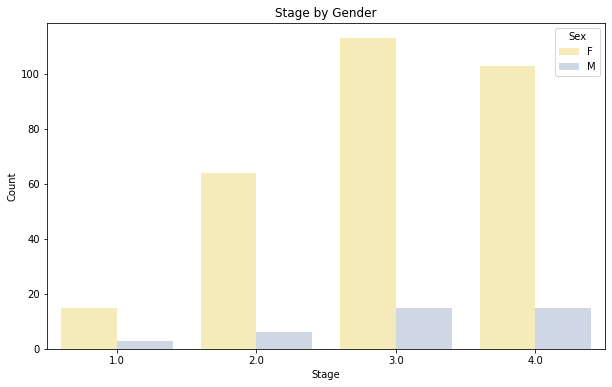

Conclusion: The largest number of females were diagnosed with stage 3 cirrhosis, with stage 4, 2, and 1 following in descending order. Similarly, among males, the highest proportion were at stage 3, followed by stages 4, 2, and 1, mirroring the pattern observed among females.


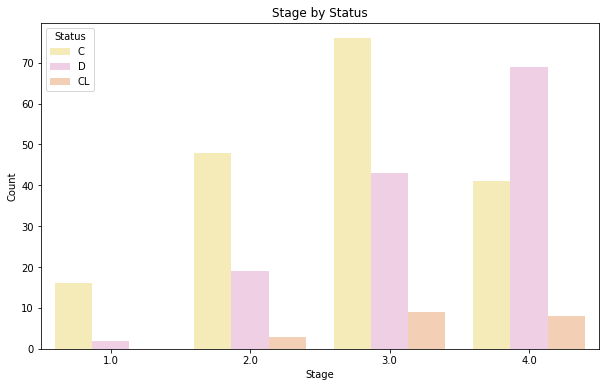

Conclusion: The largest portion of patients who were censored fell into stage 3, with stage 2, 4, and 1 following in decreasing order. Among patients censored due to liver issues, most were in stage 4, with stage 3 and 2 following, and none in stage 1. Similarly, the majority of deceased patients were in stage 4, followed by stage 3, 2, and 1.


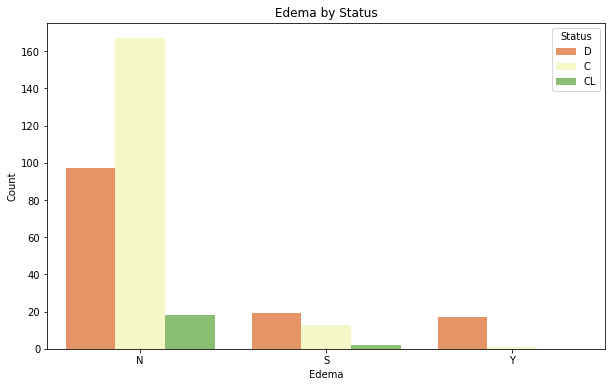

Conclusion: Most of the patients who were censored either did not have edema or were not undergoing diuretic therapy for edema. This pattern was also observed among patients censored due to liver transplant. A comparable trend was noted among patients who passed away. Interestingly, there were no cases of patients with edema despite diuretic therapy in the group censored due to liver transplant.


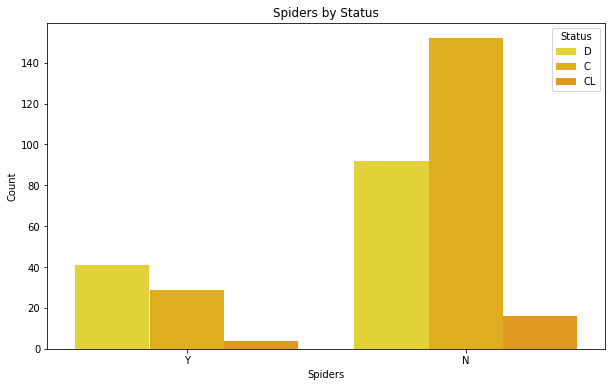

Conclusion: Most of the patients who were censored did not show visible blood vessels on their skin. The same pattern was observed in the other two groups as well.


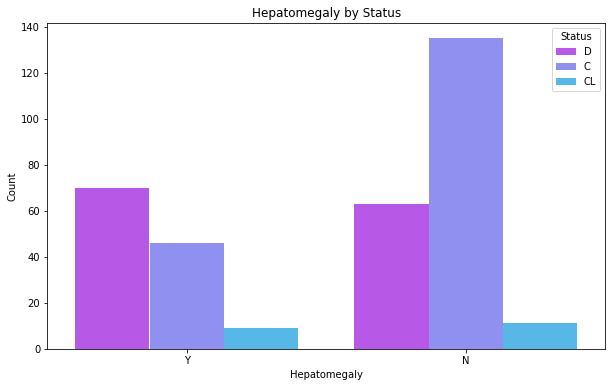

Conclusion: A higher proportion of censored patients exhibited hepatomegaly. There was a slightly higher prevalence of this condition among patients who were censored due to liver transplant. Additionally, the majority of patients who passed away had hepatomegaly compared to those who did not.


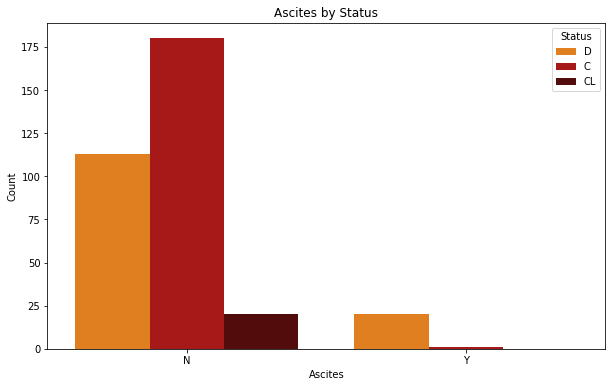

Conclusion: None of the censored and censored due to liver patients exhibited ascites, while most of the deceased patients also lacked ascites, with only a small number showing symptoms of it.


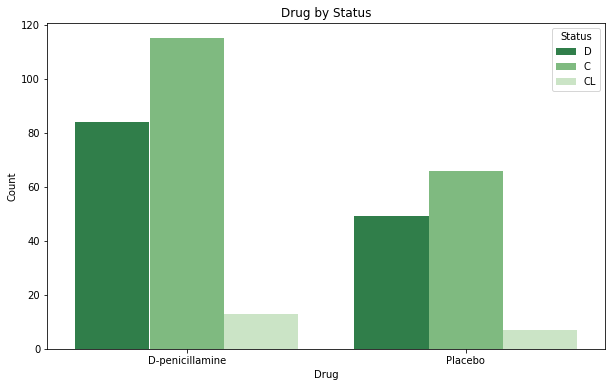

Conclusion: The greater proportion of patients in each of the three groups were administered D-penicillamine in comparison to those who were given a Placebo.


In [24]:
def plot_and_conclude(column_name, hue, xlabel, title, conclusion, palette):
    plt.figure(figsize=(10, 6))
    sns.countplot(x=column_name, hue=hue, data=train_data, palette=palette)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Count')
    plt.legend(title=hue)
    plt.show()
    print("Conclusion:", conclusion)

plot_and_conclude('Drug', 'Stage', 'Drug', 'Comparison of drug - D-penicillamine or Placebo', 
                  "A greater number of individuals diagnosed with stage 1 cirrhosis opted for D-penicillamine over a placebo. Likewise, a significant portion of stage 2, 3 and 4 patients made the same choice.",
                  'PiYG_r')

plot_and_conclude('Ascites', 'Stage', 'Ascites', 'Ascites', 
                  "There were significantly fewer patients experiencing abdominal fluid buildup overall, with around 20 patients in stage 4 showing this condition compared to stages 2 and 3, where the occurrence was notably lower.",
                  'coolwarm_r')

plot_and_conclude('Hepatomegaly', 'Stage', 'Hepatomegaly', 'Hepatomegaly', 
                  "Patients in Stage 1 did not exhibit an enlarged liver. In Stage 2, the proportion of patients with both the conditions was equal. The majority of Stage 3 and 4 patients had an enlarged liver.",
                  'Set3')

plot_and_conclude('Spiders', 'Stage', 'Spiders', 'Spiders', 
                  "A greater proportion of individuals diagnosed with stage 1 cirrhosis exhibited no discernible blood vessels on their skin. This trend was also observed among stage 2 and 3 patients. For stage 4 patients, slightly more patients had no blood vessels visible on their skin.",
                  'cool_r')

plot_and_conclude('Edema', 'Stage', 'Edema', 'Edema', 
                  "A greater percentage of individuals in stage 1 exhibited edema but did not receive treatment with diuretics or had their edema resolved by diuretic therapy. This trend was also observed among patients in stages 2, 3, and 4. In general, there were few patients across all stages who did not have edema and were not undergoing diuretic therapy for edema.",
                  'gist_rainbow_r')

plot_and_conclude('Status', 'Sex', 'Status', 'Status by Gender', 
                  "Among females, the predominant status was categorized as censored, indicating they had cirrhosis but did not experience death or undergo liver transplant. This implies that females with censored status outnumbered those who died, with very few undergoing liver transplants. In male patients, the highest count was of those who died, followed by individuals with censored status, while the occurrence of liver transplants was minimal.",
                  'Accent')

plot_and_conclude('Drug', 'Sex', 'Drug', 'Drug by Gender', 
                  "A greater proportion of female patients were given D-penicillamine in comparison to the placebo, whereas a slightly higher number of male patients received D-penicillamine.",
                  'PiYG_r')

plot_and_conclude('Ascites', 'Sex', 'Ascites', 'Ascites by Gender', 
                  "Ascites was not a common occurrence among both women and men. While only a few women encountered ascites, it was exceedingly rare among men.",
                  'coolwarm_r')

plot_and_conclude('Hepatomegaly', 'Sex', 'Hepatomegaly', 'Hepatomegaly by Gender', 
                  "Most of the female patients displayed liver enlargement, whereas males had a slightly higher occurrence of enlarged livers compared to non-enlarged ones.",
                  'Set3')

plot_and_conclude('Spiders', 'Sex', 'Spiders', 'Spiders by Gender', 
                  "Most women didn't exhibit spider veins (visible blood vessels on the skin), and this was similarly uncommon among men, with only a few having them when observed.",
                  'cool_r')

plot_and_conclude('Edema', 'Sex', 'Edema', 'Edema by Gender', 
                  "Most women did not exhibit edema and did not undergo diuretic treatment, followed by those who had edema but didn't receive diuretics, or those whose edema resolved with diuretic therapy, and finally those who still had edema despite diuretic treatment. Similarly, for men, the majority showed no edema and didn't undergo diuretic therapy, with only a small number falling into the other two categories.",
                  'gist_rainbow_r')

plot_and_conclude('Stage', 'Sex', 'Stage', 'Stage by Gender', 
                  "The largest number of females were diagnosed with stage 3 cirrhosis, with stage 4, 2, and 1 following in descending order. Similarly, among males, the highest proportion were at stage 3, followed by stages 4, 2, and 1, mirroring the pattern observed among females.",
                  'Pastel2_r')

plot_and_conclude('Stage', 'Status', 'Stage', 'Stage by Status', 
                  "The largest portion of patients who were censored fell into stage 3, with stage 2, 4, and 1 following in decreasing order. Among patients censored due to liver issues, most were in stage 4, with stage 3 and 2 following, and none in stage 1. Similarly, the majority of deceased patients were in stage 4, followed by stage 3, 2, and 1.",
                  'Pastel2_r')

plot_and_conclude('Edema', 'Status', 'Edema', 'Edema by Status', 
                  "Most of the patients who were censored either did not have edema or were not undergoing diuretic therapy for edema. This pattern was also observed among patients censored due to liver transplant. A comparable trend was noted among patients who passed away. Interestingly, there were no cases of patients with edema despite diuretic therapy in the group censored due to liver transplant.",
                  'RdYlGn')

plot_and_conclude('Spiders', 'Status', 'Spiders', 'Spiders by Status', 
                  "Most of the patients who were censored did not show visible blood vessels on their skin. The same pattern was observed in the other two groups as well.",
                  'Wistia')

plot_and_conclude('Hepatomegaly', 'Status', 'Hepatomegaly', 'Hepatomegaly by Status', 
                  "A higher proportion of censored patients exhibited hepatomegaly. There was a slightly higher prevalence of this condition among patients who were censored due to liver transplant. Additionally, the majority of patients who passed away had hepatomegaly compared to those who did not.",
                  'cool_r')

plot_and_conclude('Ascites', 'Status', 'Ascites', 'Ascites by Status', 
                  "None of the censored and censored due to liver patients exhibited ascites, while most of the deceased patients also lacked ascites, with only a small number showing symptoms of it.",
                  'gist_heat_r')

plot_and_conclude('Drug', 'Status', 'Drug', 'Drug by Status', 
                  "The greater proportion of patients in each of the three groups were administered D-penicillamine in comparison to those who were given a Placebo.",
                  'Greens_r')

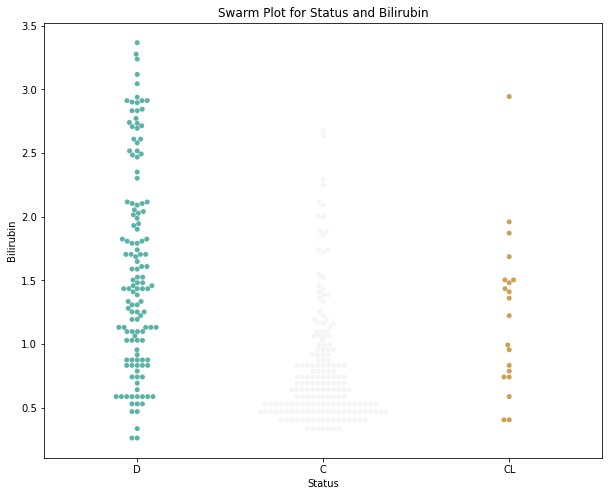

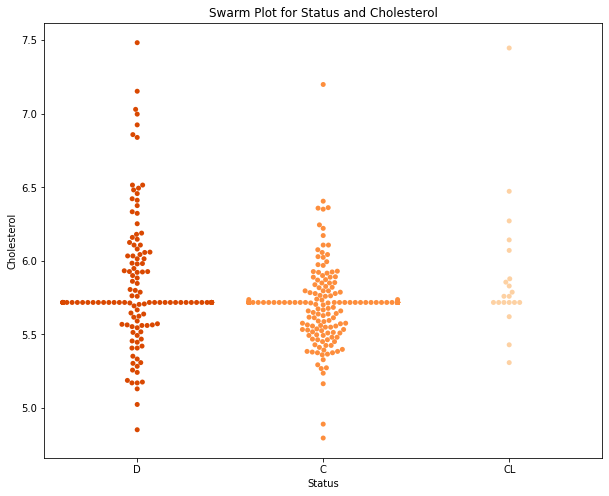

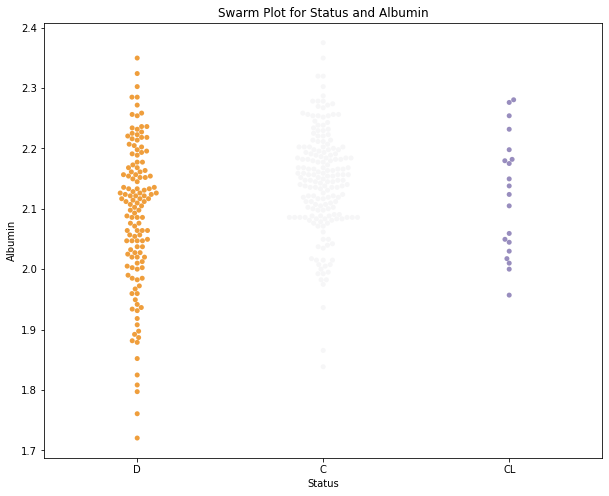

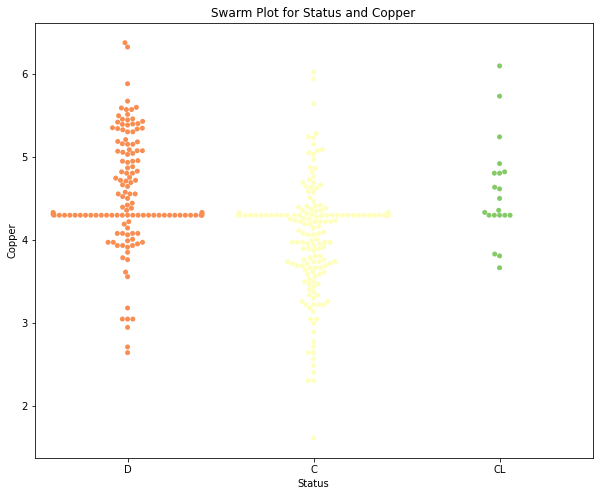

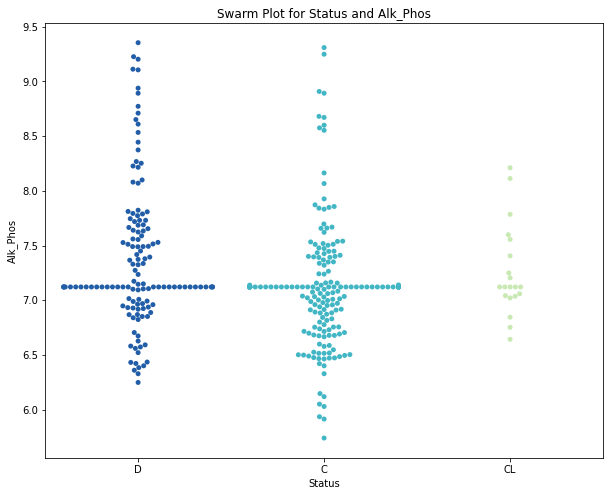

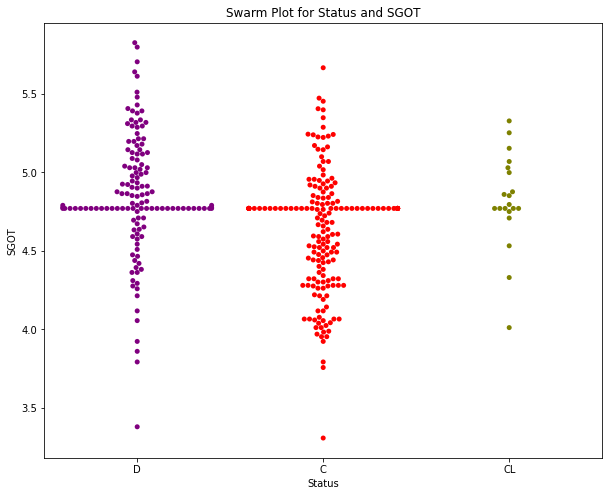

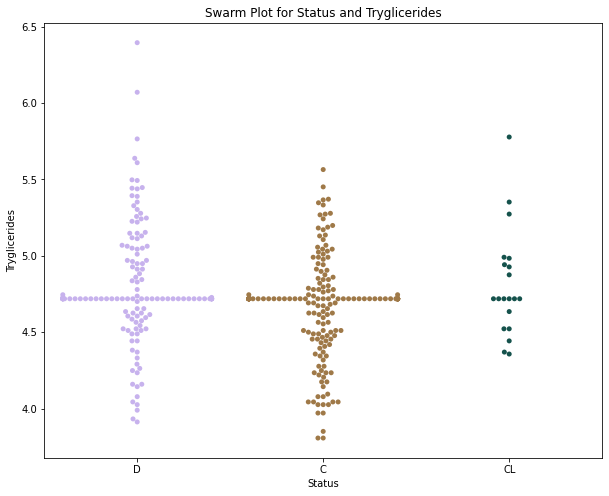

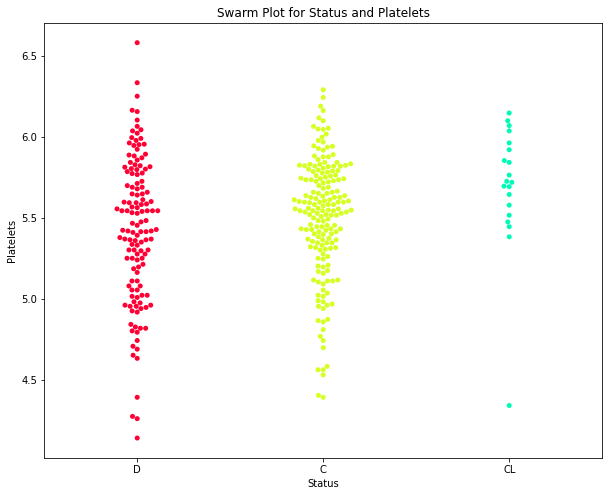

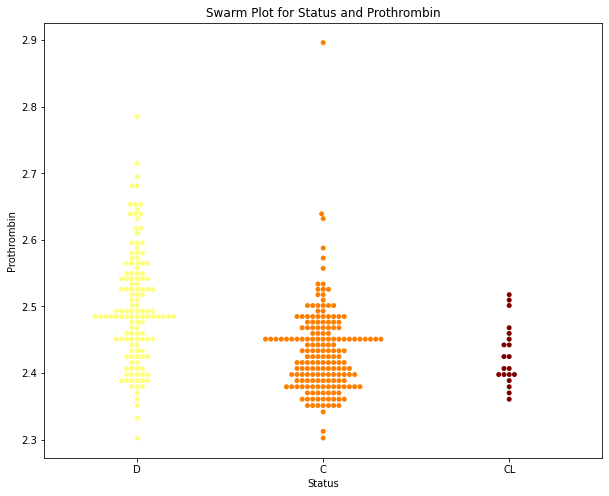

In [25]:
palettes = ['BrBG_r', 'Oranges_r', 'PuOr', 'RdYlGn', 'YlGnBu_r', 'brg', 'cubehelix_r', 'gist_ncar_r', 'afmhot_r']

variables = ["Bilirubin", "Cholesterol", "Albumin", "Copper", "Alk_Phos", "SGOT", "Tryglicerides", "Platelets", "Prothrombin"]
for i, var in enumerate(variables):
    plt.figure(figsize=(10, 8))
    sns.swarmplot(x="Status", y=var, data=train_data, palette=palettes[i])
    plt.title(f'Swarm Plot for Status and {var}')
    plt.xlabel('Status')
    plt.ylabel(var)
    plt.show()

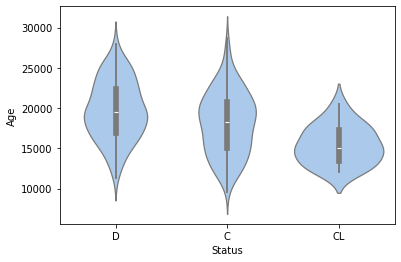

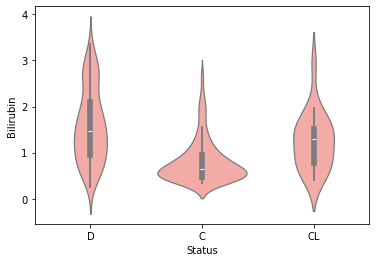

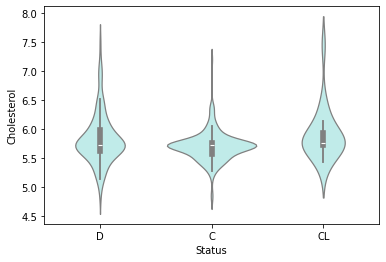

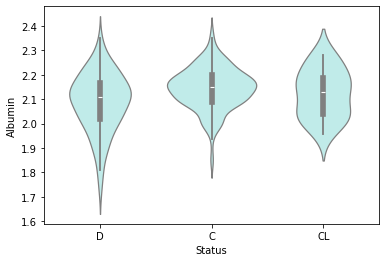

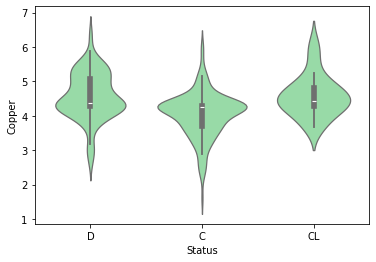

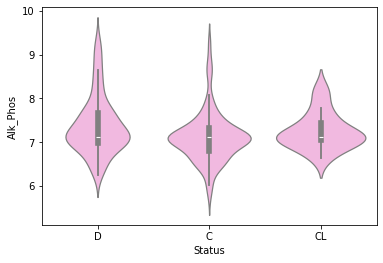

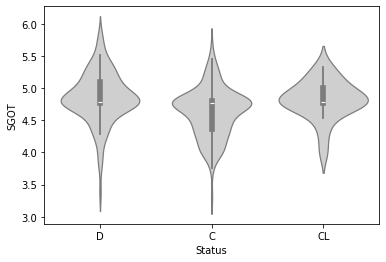

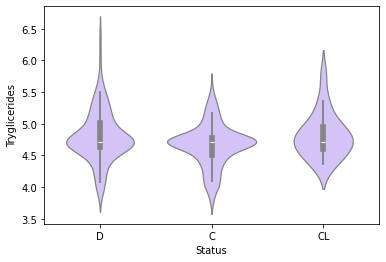

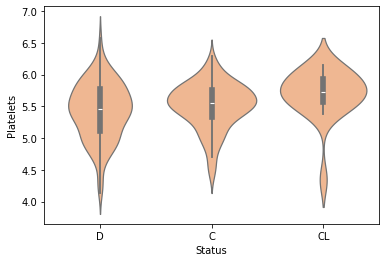

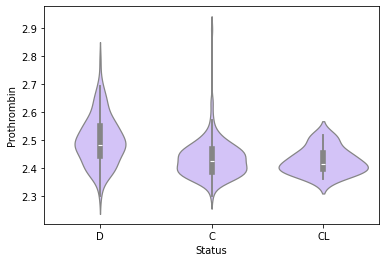

In [26]:
palette = ['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b', '#fab0e4', '#cfcfcf', '#fffea3', '#b9f2f0']
for i in train_data.select_dtypes(['int64', 'float64']).drop(['Stage', 'ID', 'N_Days'], axis = 1):
    sns.violinplot(x = train_data['Status'], y = train_data[i], color = np.random.choice(palette)) 
    plt.xlabel('Status')
    plt.ylabel(i)
    plt.show()

In [27]:
le = LabelEncoder()
columns_to_encode = ['Status', 'Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema']

for column in columns_to_encode:
    label = le.fit_transform(train_data[column])
    train_data.drop(column, axis=1, inplace=True)
    train_data[column] = label

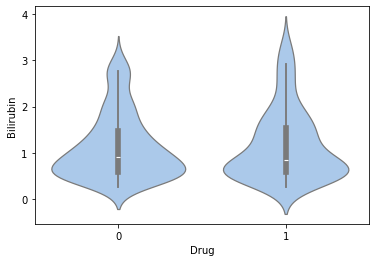

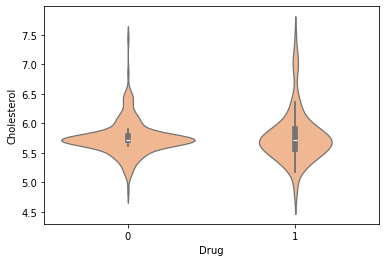

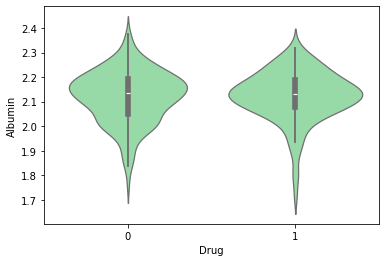

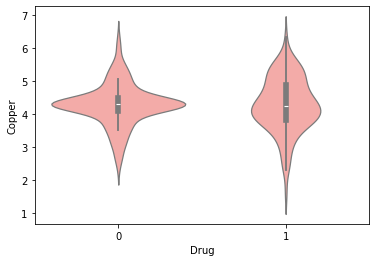

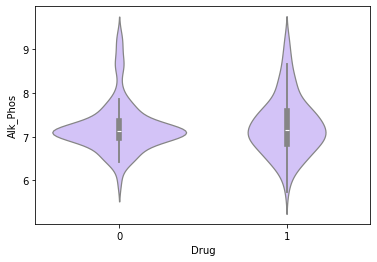

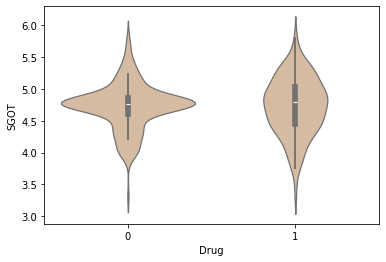

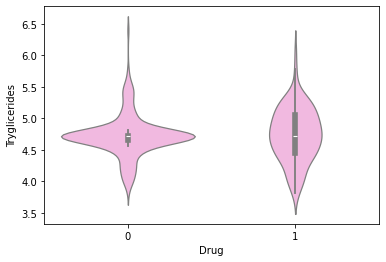

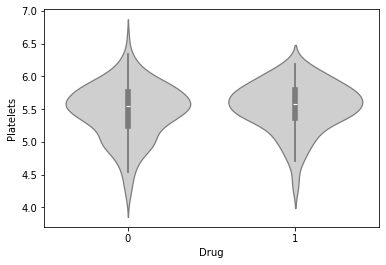

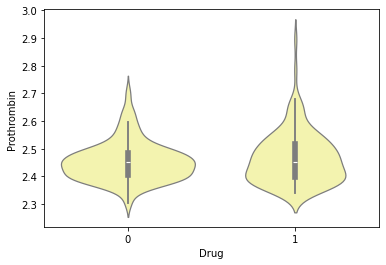

In [28]:
palette = ['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b', '#fab0e4', '#cfcfcf', '#fffea3', '#b9f2f0']
cols = ['Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin']

for i, color in zip(cols, palette):
    sns.violinplot(x = train_data['Drug'], y = train_data[i], color=color) 
    plt.xlabel('Drug')
    plt.ylabel(i)
    plt.show()

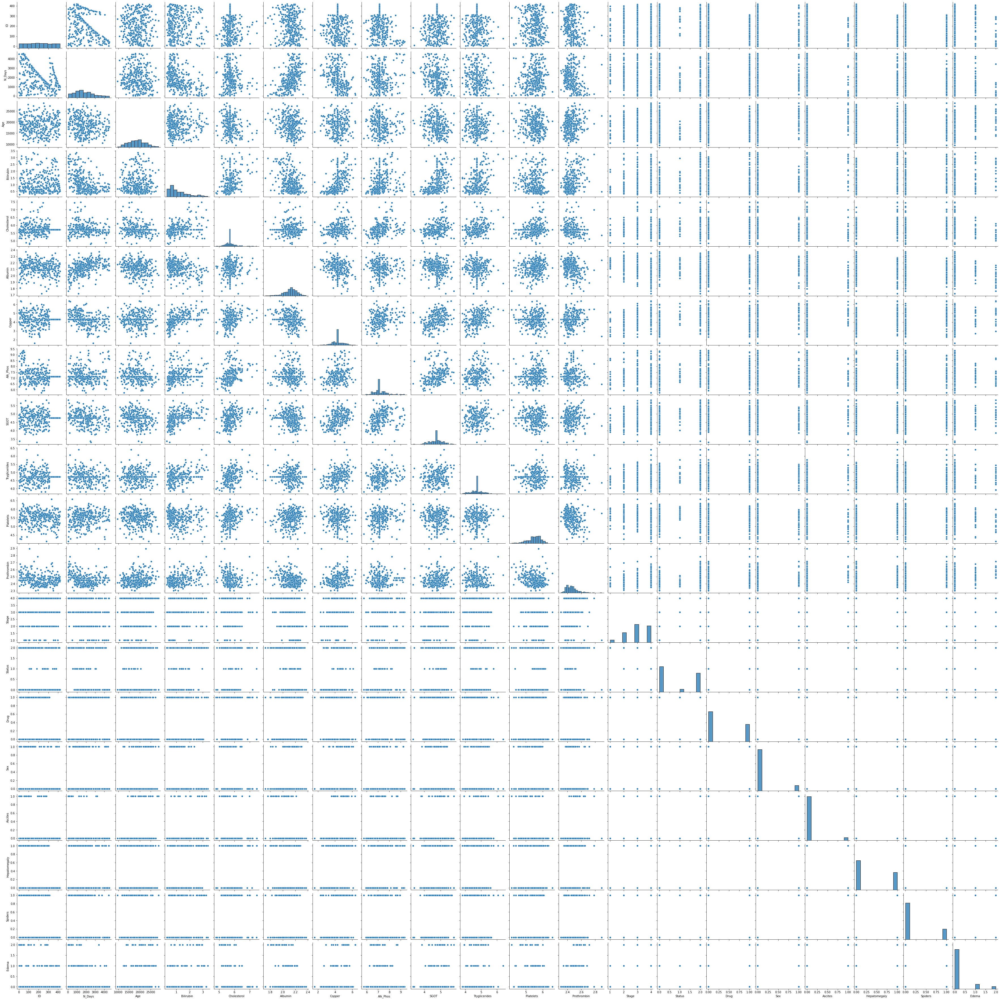

In [29]:
sns.pairplot(train_data)

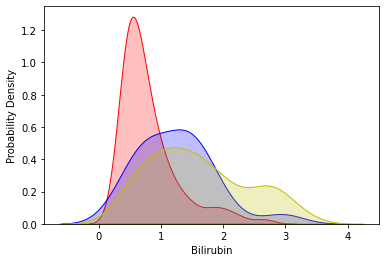

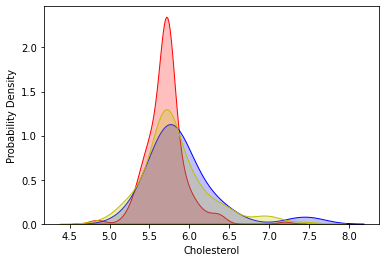

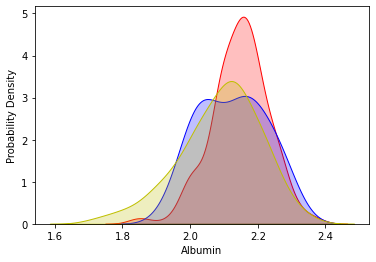

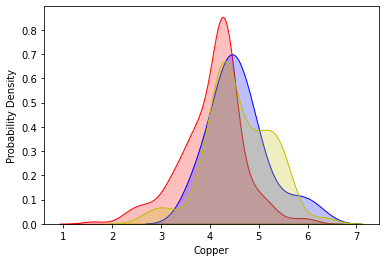

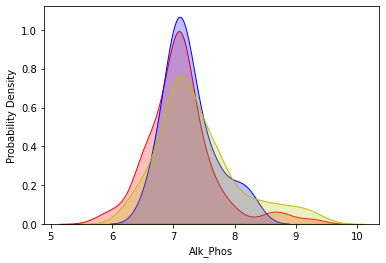

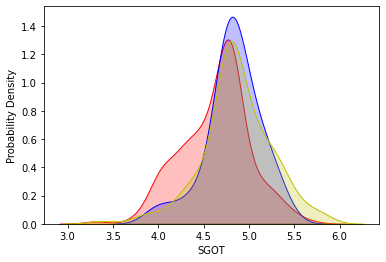

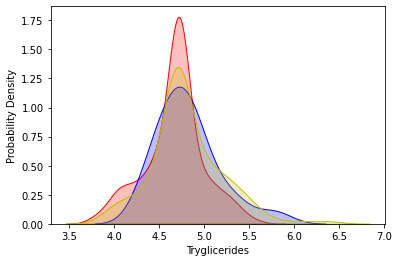

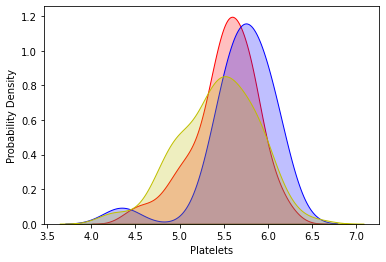

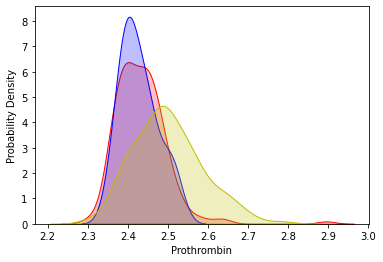

In [30]:
for i in train_data[['Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin']]:
    sns.kdeplot(train_data.loc[(train_data['Status']== 0),i], color='r', shade=True, label='0')
    sns.kdeplot(train_data.loc[(train_data['Status']== 1), i], color='b', shade=True, label='1')
    sns.kdeplot(train_data.loc[(train_data['Status']== 2), i], color='y', shade=True, label='2')
    plt.xlabel(i)
    plt.ylabel('Probability Density')
    plt.show()

In [31]:
train_data.corr()

,ID,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema
ID,1.000000,-0.376808,0.008819,-0.005903,-0.015455,-0.122660,-0.021348,-0.264401,0.043283,-0.032861,-0.074394,-0.228685,-0.000597,-0.268481,-0.331328,-0.102271,-0.196684,-0.367651,-0.239361,-0.145252
N_Days,-0.376808,1.000000,-0.114653,-0.467164,-0.099806,0.451879,-0.353008,0.088417,-0.232338,-0.156873,0.144066,-0.170921,-0.381327,-0.406610,0.047369,0.001047,-0.248467,-0.155874,-0.196435,-0.308921
Age,0.008819,-0.114653,1.000000,-0.014190,-0.198376,-0.196353,0.006748,-0.110430,-0.181524,-0.019342,-0.140648,0.191807,0.196672,0.188631,-0.130623,0.176462,0.189681,0.034784,-0.065611,0.207953
Bilirubin,-0.005903,-0.467164,-0.014190,1.000000,0.332020,-0.360910,0.498450,0.222876,0.474522,0.352693,-0.105351,0.344881,0.295284,0.519253,0.027932,0.017491,0.313173,0.273343,0.266324,0.281374
Cholesterol,-0.015455,-0.099806,-0.198376,0.332020,1.000000,0.013701,0.228233,0.339046,0.334099,0.348418,0.236530,-0.109132,0.025242,0.173915,0.026917,-0.016075,-0.088176,0.146401,0.043126,-0.177818
Albumin,-0.122660,0.451879,-0.196353,-0.360910,0.013701,1.000000,-0.268274,-0.079288,-0.202917,-0.082848,0.177362,-0.239748,-0.348240,-0.262360,0.012174,0.046941,-0.339907,-0.216520,-0.190476,-0.361239
Copper,-0.021348,-0.353008,0.006748,0.498450,0.228233,-0.268274,1.000000,0.263089,0.394080,0.332797,-0.067188,0.156456,0.293072,0.360260,0.001536,0.221230,0.234993,0.247333,0.218862,0.210882
Alk_Phos,-0.264401,0.088417,-0.110430,0.222876,0.339046,-0.079288,0.263089,1.000000,0.301429,0.222262,0.147715,0.025209,0.085140,0.209478,0.034676,0.033107,0.037780,0.194131,0.055692,-0.026539
SGOT,0.043283,-0.232338,-0.181524,0.474522,0.334099,-0.202917,0.394080,0.301429,1.000000,0.138703,-0.113830,0.078061,0.201377,0.277760,0.001834,-0.016321,0.067672,0.117559,0.154396,0.109737
Tryglicerides,-0.032861,-0.156873,-0.019342,0.352693,0.348418,-0.082848,0.332797,0.222262,0.138703,1.000000,0.020980,-0.011168,0.142058,0.177670,0.024852,0.067284,0.170276,0.172180,0.023755,0.027235


### Principal Component Analysis

0.6999539362145408


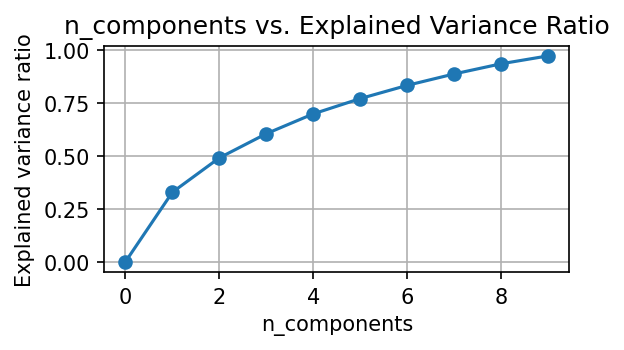

In [32]:
train_data.drop(['ID', 'N_Days'], axis=1, inplace=True)  
X = train_data[['Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin']]
y = train_data['Status']

scaler = preprocessing.RobustScaler()
robust_df = scaler.fit_transform(X)
robust_df = pd.DataFrame(robust_df, columns = X.columns)

train_data.drop(['Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin'], axis=1, inplace=True)
train_data = pd.concat([train_data, robust_df], axis=1)

nums = np.arange(10)

var_ratio = []
for num in nums:
  pca = PCA(n_components=num)
  pca.fit(robust_df)
  var_ratio.append(np.sum(pca.explained_variance_ratio_))


plt.figure(figsize=(4,2),dpi=150)
plt.grid()
plt.plot(nums,var_ratio,marker='o')
plt.xlabel('n_components')
plt.ylabel('Explained variance ratio')
plt.title('n_components vs. Explained Variance Ratio')

pca = PCA(n_components = 4)
pca.fit_transform(robust_df)

print(sum(pca.explained_variance_ratio_))

### Feature Selection

### Filter Methods

### Chi-Square Test

In [33]:
X_train = train_data.drop('Status', axis = 1)
y_train = train_data['Status']

X = train_data.drop(columns=['Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin', 'Status'], axis=1)
y = train_data['Status']

X = X.fillna(X.mode().iloc[0])
y = y.fillna(y.mode().iloc[0])

print(X.isnull().sum())
print(y.isnull().sum())

chi_scores = chi2(X, y)

Stage           0
Drug            0
Sex             0
Ascites         0
Hepatomegaly    0
Spiders         0
Edema           0
dtype: int64
0


In [34]:
chi_scores

(array([ 7.59240398,  2.88790918, 13.22208543, 36.07699862, 32.69982642,
        16.74265974, 56.4427129 ]),
 array([2.24558978e-02, 2.35992657e-01, 1.34542852e-03, 1.46547795e-08,
        7.93090801e-08, 2.31407607e-04, 5.54141430e-13]))

<AxesSubplot:>

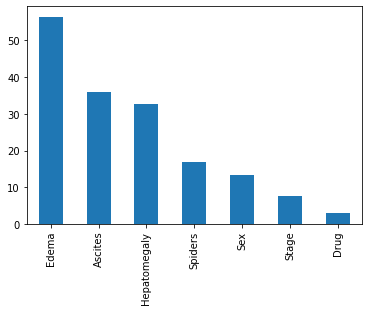

In [35]:
chi_values = pd.Series(chi_scores[0], index=X.columns)
chi_values.sort_values(ascending=False, inplace=True)
chi_values.plot.bar()

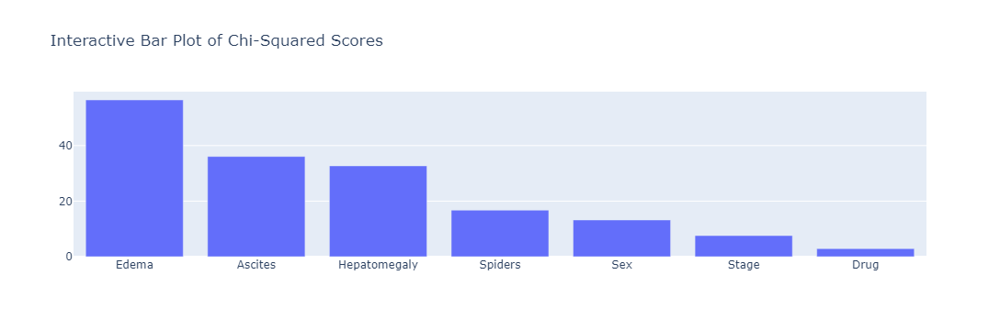

In [36]:
import plotly.graph_objects as go
import plotly.express as px

fig_chi2 = go.Figure()
fig_chi2.add_trace(go.Bar(x=chi_values.index, y=chi_values.values))
fig_chi2.update_layout(title='Interactive Bar Plot of Chi-Squared Scores')
fig_chi2.show()

### Pearson's Correlation

In [37]:
train_data.corr()['Status']

Stage            0.307167
Status           1.000000
Drug             0.003456
Sex              0.151721
Ascites          0.283222
Hepatomegaly     0.270758
Spiders          0.170179
Edema            0.286970
Age             -0.005797
Bilirubin        0.126678
Cholesterol     -0.111042
Albumin         -0.042314
Copper           0.011621
Alk_Phos        -0.050865
SGOT             0.124928
Tryglicerides   -0.001269
Platelets       -0.104775
Prothrombin      0.017941
Name: Status, dtype: float64

In [38]:
X_train = X_train.fillna(X_train.mode().iloc[0])
y_train = y_train.fillna(y_train.mode().iloc[0])
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending = False)

Hepatomegaly     0.099271
Spiders          0.059091
Stage            0.058761
Ascites          0.046437
Edema            0.039610
Copper           0.010558
Tryglicerides    0.008184
SGOT             0.007552
Cholesterol      0.005977
Alk_Phos         0.005527
Prothrombin      0.002296
Albumin          0.002068
Drug             0.000000
Age              0.000000
Sex              0.000000
Platelets        0.000000
Bilirubin        0.000000
dtype: float64

### Wrapper Methods

In [39]:
num_features = X_train.shape[1]
k_features_range = (1, num_features)

forward_feature_selection = SequentialFeatureSelector(
    RandomForestClassifier(),
    k_features=k_features_range,
    forward=True,
    floating=False,
    verbose=2,
    scoring='accuracy',
    cv=5
).fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  17 out of  17 | elapsed:   17.0s finished

[2024-04-28 01:21:02] Features: 1/17 -- score: 0.6862025316455697[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  16 out of  16 | elapsed:   16.5s finished

[2024-04-28 01:21:18] Features: 2/17 -- score: 0.7039240506329113[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:   17.1s finished

[2024-04-28 01:21:36] Features: 3/17 -- score: 0.6989556962025316[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

In [40]:
num_features = X_train.shape[1]
k_features_range = (1, num_features)

forward_feature_selection = SequentialFeatureSelector(
    svm.SVC(),
    k_features=k_features_range,
    forward=True,
    floating=False,
    verbose=2,
    scoring='accuracy',
    cv=5
).fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  17 out of  17 | elapsed:    0.9s finished

[2024-04-28 01:23:38] Features: 1/17 -- score: 0.6862025316455697[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  16 out of  16 | elapsed:    0.9s finished

[2024-04-28 01:23:39] Features: 2/17 -- score: 0.6862025316455698[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:    0.8s finished

[2024-04-28 01:23:40] Features: 3/17 -- score: 0.6886075949367089[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  